# Problemas de Clasificación

Utilizando el dataset dicho:

https://www.kaggle.com/datasets/atharvasoundankar/global-food-wastage-dataset-2018-2024

tambien es posible resolver algunas problemas que requieren modelos de clasificacion. Algunos ejemplos de problemas potenciales son:

- Predicción del Origen del Desperdicio (domestico o industrial)
- Clasificación del Impacto Económico (poco/moderado/mucho impacto)
- Potencial de Reducción de Desperdicio (si hay poco/moderado/mucho potencial)
- Predicción de la Categoría de Alimentos
- Clasificación de tendencias interanuales (si va a crecer o no)

Pero primero, tenemos que ver los atributos que podemos utilizar para un problema de clasificacion



> IMPORTANTE: los datos en el dataset son generados y no representan la situacion real. Vamos a seguir utilizando los metodos correctos de ML, pero es posible que los resultados de los modelos entrenados sean poco representativos.



In [14]:
pip install scikit-learn

In [15]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
import shap
import warnings
warnings.filterwarnings('ignore')

SEED = 42

df = pd.read_csv('global_food_wastage_dataset.csv', encoding = 'utf-8')
df = df.dropna()
df = df.drop_duplicates()

df = df.reset_index(drop=True)

label = LabelEncoder()

df['Country'] = label.fit_transform(df['Country'])
df['Food Category'] = label.fit_transform(df['Food Category'])

df.head()

,Country,Year,Food Category,Total Waste (Tons),Economic Loss (Million $),Avg Waste per Capita (Kg),Population (Million),Household Waste (%)
0,1,2019,4,19268.63,18686.68,72.69,87.59,53.64
1,8,2019,7,3916.97,4394.48,192.52,1153.99,30.61
2,6,2022,2,9700.16,8909.16,166.94,1006.11,48.08
3,5,2023,4,46299.69,40551.22,120.19,953.05,31.91
4,5,2023,1,33096.57,36980.82,104.74,1105.47,36.06


In [16]:
df.describe()

,Country,Year,Food Category,Total Waste (Tons),Economic Loss (Million $),Avg Waste per Capita (Kg),Population (Million),Household Waste (%)
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,9.525800,2021.015600,3.532200,25061.780072,25039.703870,109.46397,706.606416,50.060890
std,5.753638,1.999239,2.332563,14245.119588,14620.236429,51.93373,402.546464,11.596203
min,0.000000,2018.000000,0.000000,502.610000,406.690000,20.09000,11.290000,30.020000
25%,5.000000,2019.000000,1.000000,12783.737500,12612.477500,64.05000,350.602500,40.012500
50%,9.000000,2021.000000,4.000000,24865.220000,24428.155000,110.08000,713.530000,50.295000
75%,15.000000,2023.000000,6.000000,37471.035000,37146.037500,154.52500,1057.255000,60.125000
max,19.000000,2024.000000,7.000000,49990.760000,59228.930000,199.97000,1399.970000,70.000000


Primero, vamos a ver que relaciones hay entre los atributos y para esto, utilizamos diagramas.

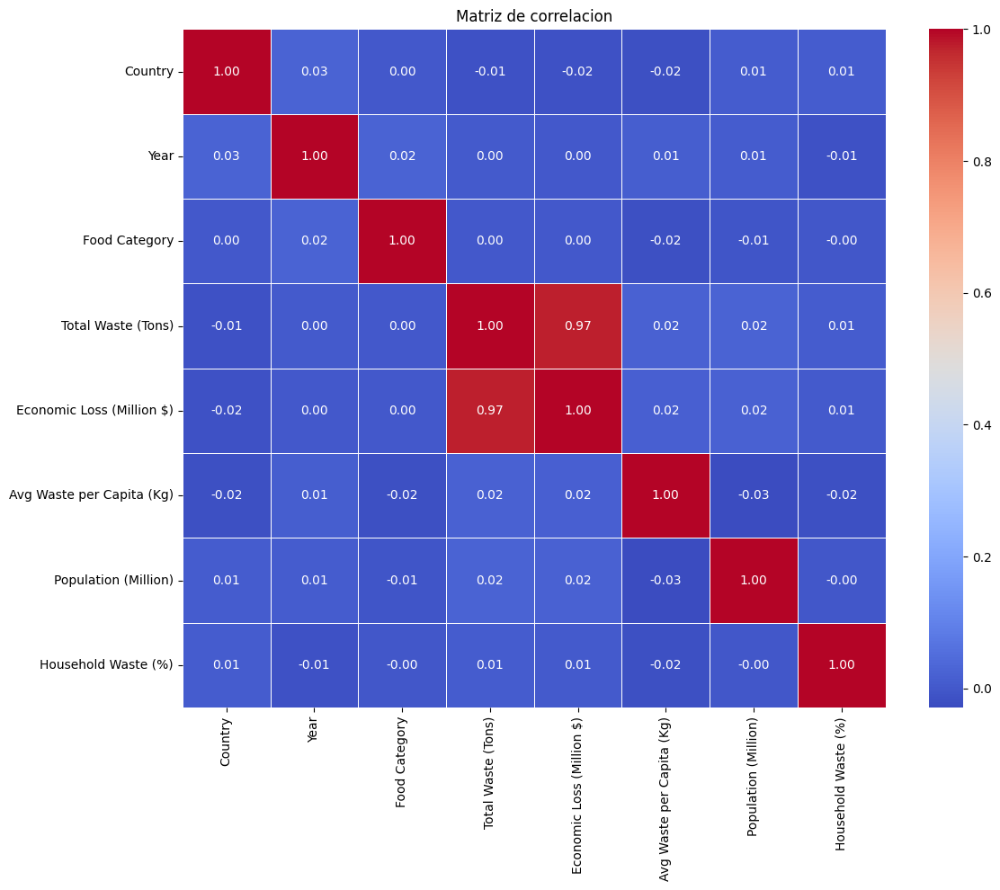

In [18]:
# Matriz de correlacion
plt.figure(figsize=(12, 10))
corr = df[df.columns].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de correlacion')
plt.tight_layout()
plt.show()

Podemos ver que generalmente hay poca correlacion entre los atributos, con excepcion de "**Total Waste (Tons)**" y "**Economic Loss (Million $)**". Por esto, vamos a utilizar estos dos atributos para los modelos.

La problema de clasificacion que podemos resolver con estos datos es **Clasificación del Impacto Económico**. Dependiendo del desperdicio total y perdida economica, podemos clasificar los paises en tres categorias:

- Bajo impacto (si la perdida es baja)
- Medio impacto
- Alto impacto (si la perdida es alta)

Para poder hacer esto, vamos a decidir los umbrales de cada categoria y tambien transformar su valores textuales (bajo, medio, alto) en los valores numericos para el entrenamiento.

In [19]:
# Definimos los umbrales de las categorias del riesgo basado en 'waste per capita'
low_threshold = df['Economic Loss (Million $)'].quantile(0.33)
high_threshold = df['Economic Loss (Million $)'].quantile(0.67)

def categoriza_riesgo(economic_loss):
  if economic_loss <= low_threshold:
    return 'Low'
  elif economic_loss <= high_threshold:
    return 'Medium'
  else:
    return 'High'

df['Risk Category'] = df['Economic Loss (Million $)'].apply(categoriza_riesgo)

# Datos de distribucion
print("Distribucion de clases:")
print(df['Risk Category'].value_counts())

print()
print("Umbrales de categorias del riesgo:")
print(f"Bajo riesgo: <= {low_threshold:.2f} perdida economica en millones")
print(f"Medio riesgo: {low_threshold:.2f} - {high_threshold:.2f} perdida economica en millones")
print(f"Alto riesgo: > {high_threshold:.2f} perdida economica en millones")

# Utilizamos el LabelEncoder para transformar datos textuales de categorias en numeros
le = LabelEncoder()
df['Risk Category (Encoded)'] = le.fit_transform(df['Risk Category'])

Distribucion de clases:
Risk Category
Medium    1700
Low       1650
High      1650
Name: count, dtype: int64

Umbrales de categorias del riesgo:
Bajo riesgo: <= 16335.24 perdida economica en millones
Medio riesgo: 16335.24 - 33009.40 perdida economica en millones
Alto riesgo: > 33009.40 perdida economica en millones


Hemos preparado los datos, ahora vamos a seleccionar los atributos para entrenamiento de modelos de clasificacion

In [20]:
# Seleccionamos los atributos para entrenamiento
features = ['Total Waste (Tons)']

X = df[features]
y = df['Risk Category (Encoded)']

# Separamos datos de entrenamiento y evaluacion
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=SEED, stratify=y)

print("Datos de entrenamiento:", X_train.shape)
print("Datos de evaluacion:", X_test.shape)

Datos de entrenamiento: (3250, 1)
Datos de evaluacion: (1750, 1)


Ahora tenemos los datos de entrenamiento y evaluacion. Podemos visualizar las distribuciones que los datos tienen.

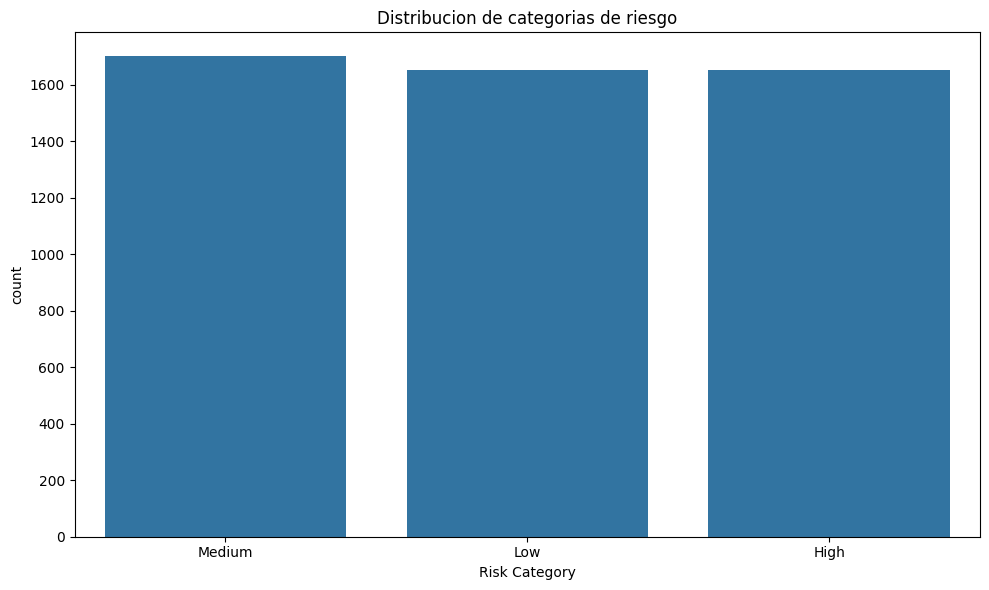

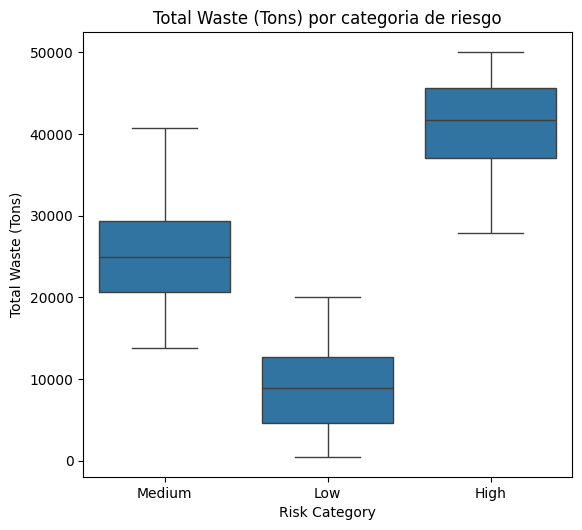

In [21]:
# Distribucion de categorias de riesgo
plt.figure(figsize=(10, 6))
sns.countplot(x='Risk Category', data=df)
plt.title('Distribucion de categorias de riesgo')
plt.tight_layout()
plt.show()

# Distribuciones de otros atributos por las categorias de riesgo
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features[:6]):
  plt.subplot(2, 3, i+1)
  sns.boxplot(x='Risk Category', y=feature, data=df)
  plt.title(f'{feature} por categoria de riesgo')
plt.tight_layout()
plt.show()

En los graficos podemos ver que clases de riesgo son equilibradas. No se requieren técnicas de equilibrio de clases como el sobremuestreo o submuestreo. Y tambien no hay outliers significativos.

Ahora, podemos entrenar varios modelos de clasificacion y comparar los resultados.

In [22]:
def evaluate_model(model, X_train, X_test, y_train, y_test, model_name):
  # Entrenamos
  model.fit(X_train, y_train)

  # Hacemos predicciones
  y_pred = model.predict(X_test)

  # Calculamos precision
  accuracy = accuracy_score(y_test, y_pred)

  print(f"\n{model_name} Resultados:")
  print(f"Precision: {accuracy:.4f}")

  # Classification report
  print("\nClassification Report:")
  print(classification_report(y_test, y_pred, target_names=le.classes_))

  # Matriz de confusion
  plt.figure(figsize=(8, 6))
  cm = confusion_matrix(y_test, y_pred)
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
              xticklabels=le.classes_, yticklabels=le.classes_)
  plt.title(f'Confusion Matrix - {model_name}')
  plt.ylabel('Verdadero real')
  plt.xlabel('Predicho')
  plt.tight_layout()
  plt.show()

  return model, accuracy

Intentamos con cada modelo, uno por uno (en total vamos a mirar 5 modelos)


Random Forest Resultados:
Precision: 0.8560

Classification Report:
              precision    recall  f1-score   support

        High       0.86      0.84      0.85       578
         Low       0.91      0.95      0.93       577
      Medium       0.80      0.78      0.79       595

    accuracy                           0.86      1750
   macro avg       0.86      0.86      0.86      1750
weighted avg       0.85      0.86      0.86      1750



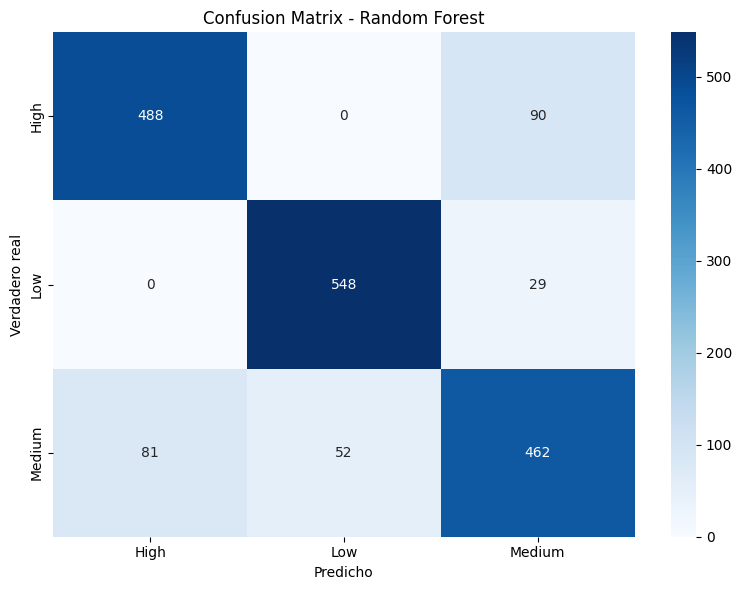


Support Vector Machine Resultados:
Precision: 0.8891

Classification Report:
              precision    recall  f1-score   support

        High       0.90      0.90      0.90       578
         Low       0.92      0.95      0.93       577
      Medium       0.85      0.82      0.83       595

    accuracy                           0.89      1750
   macro avg       0.89      0.89      0.89      1750
weighted avg       0.89      0.89      0.89      1750



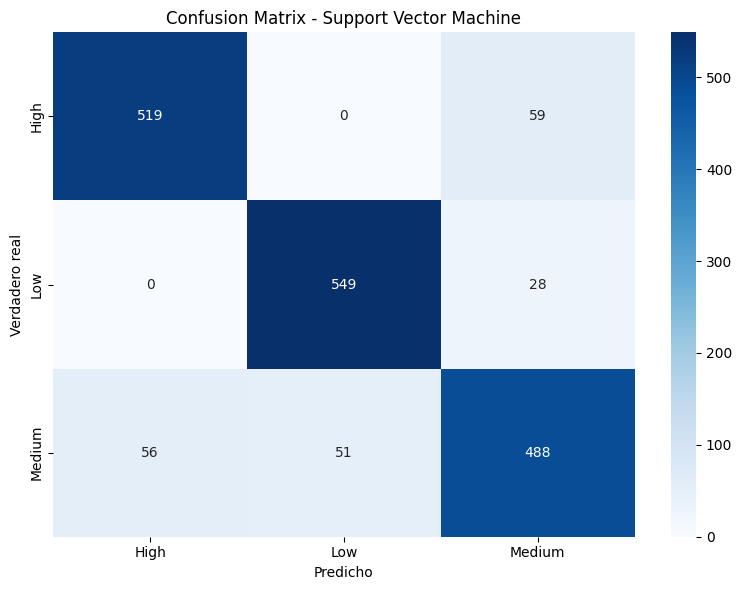


Gradient Boosting Resultados:
Precision: 0.8800

Classification Report:
              precision    recall  f1-score   support

        High       0.89      0.88      0.89       578
         Low       0.91      0.95      0.93       577
      Medium       0.84      0.80      0.82       595

    accuracy                           0.88      1750
   macro avg       0.88      0.88      0.88      1750
weighted avg       0.88      0.88      0.88      1750



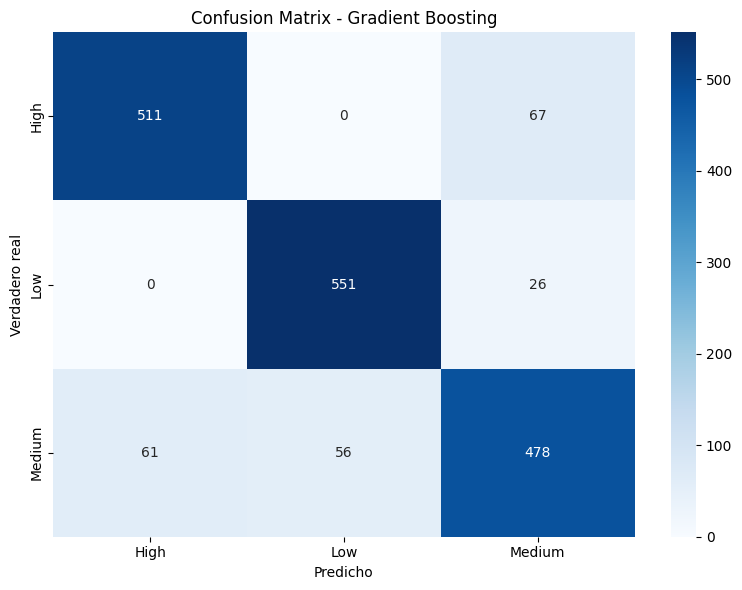


K-Nearest Neighbors Resultados:
Precision: 0.8749

Classification Report:
              precision    recall  f1-score   support

        High       0.89      0.87      0.88       578
         Low       0.91      0.96      0.93       577
      Medium       0.83      0.79      0.81       595

    accuracy                           0.87      1750
   macro avg       0.87      0.88      0.87      1750
weighted avg       0.87      0.87      0.87      1750



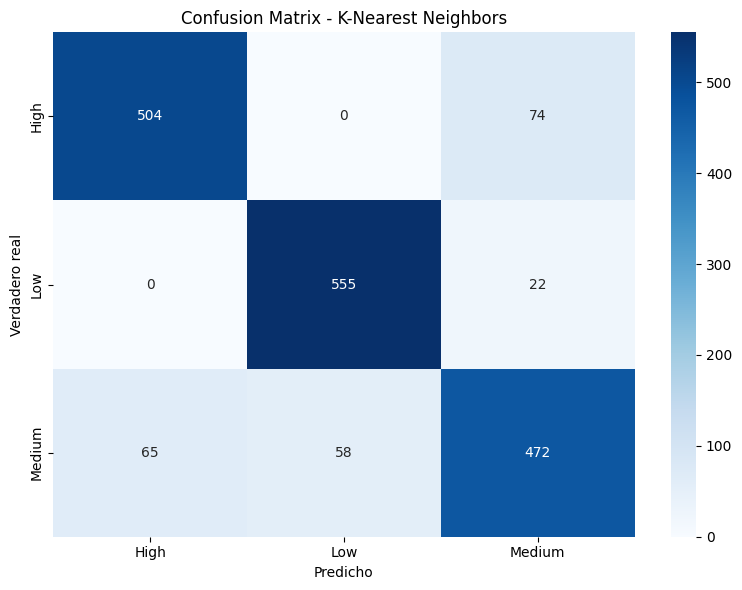


Decision Tree Resultados:
Precision: 0.8549

Classification Report:
              precision    recall  f1-score   support

        High       0.86      0.84      0.85       578
         Low       0.91      0.95      0.93       577
      Medium       0.79      0.77      0.78       595

    accuracy                           0.85      1750
   macro avg       0.85      0.86      0.85      1750
weighted avg       0.85      0.85      0.85      1750



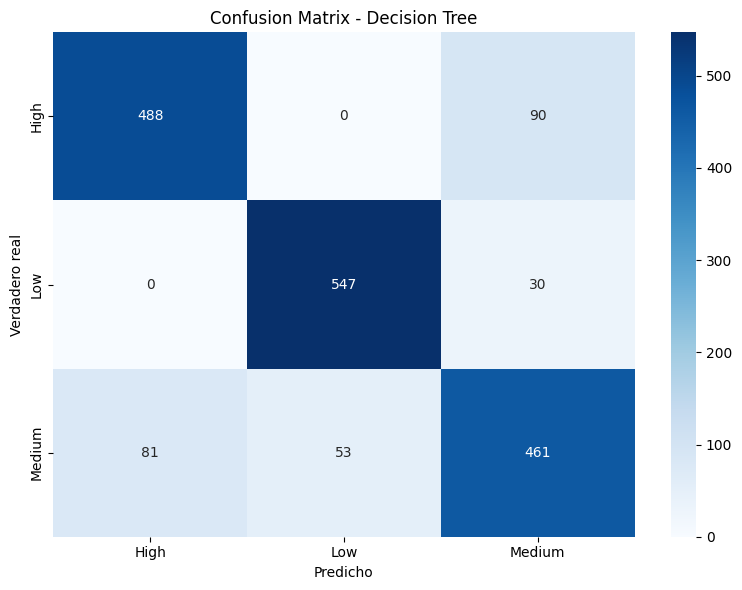

In [23]:
model_accuracies = {}

# Random Forest
rf_model = RandomForestClassifier(random_state=SEED)
rf_model, rf_acc = evaluate_model(rf_model, X_train, X_test,
                                  y_train, y_test, "Random Forest")
model_accuracies["Random Forest"] = rf_acc

# Support Vector Machine
svm_model = SVC(probability=True, random_state=SEED)
svm_model, svm_acc = evaluate_model(svm_model, X_train, X_test,
                                   y_train, y_test, "Support Vector Machine")
model_accuracies["Support Vector Machine"] = svm_acc

# Gradient Boosting
gb_model = GradientBoostingClassifier(random_state=SEED)
gb_model, gb_acc = evaluate_model(gb_model, X_train, X_test,
                                 y_train, y_test, "Gradient Boosting")
model_accuracies["Gradient Boosting"] = gb_acc

# K-Nearest Neighbors
knn_model = KNeighborsClassifier()
knn_model, knn_acc = evaluate_model(knn_model, X_train, X_test,
                                   y_train, y_test, "K-Nearest Neighbors")
model_accuracies["K-Nearest Neighbors"] = knn_acc

# Decision Tree
dt_model = DecisionTreeClassifier(random_state=SEED)
dt_model, dt_acc = evaluate_model(dt_model, X_train, X_test,
                                 y_train, y_test, "Decision Tree")
model_accuracies["Decision Tree"] = dt_acc

Comparamos los resultados de cada modelo

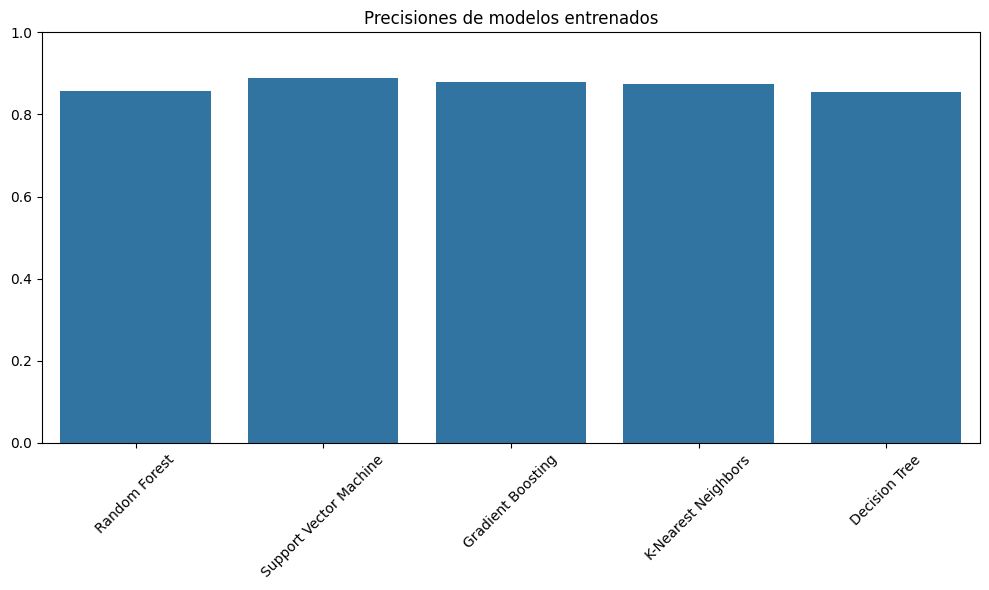

In [24]:
plt.figure(figsize=(10, 6))
models = list(model_accuracies.keys())
accuracies = list(model_accuracies.values())
sns.barplot(x=models, y=accuracies)
plt.title('Precisiones de modelos entrenados')
plt.ylim(0, 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [25]:
# Encontramos el mejor modelo
best_model_name = max(model_accuracies, key=model_accuracies.get)
print(f"{best_model_name} (precision: {model_accuracies[best_model_name]:.4f})")

Support Vector Machine (precision: 0.8891)


Utilizamos XAI para explorar mas los resultados obtenidos. Especificamente, utilizaremos LIME.

In [26]:
!pip install alibi[all]
!pip install lime

In [27]:
# Tomamos la primera instancia del conjunto test para hacer pruebas
instance_idx = 0
instance = X_test[instance_idx:instance_idx+1]
instance_prediction = svm_model.predict(instance)[0]
instance_real = y_test.iloc[instance_idx]

print("Instancia:")
print(instance)
print("Prediccion:")
print(instance_prediction)
print("Valor real:")
print(instance_real)

Instancia:
      Total Waste (Tons)
1816            19438.29
Prediccion:
2
Valor real:
2


In [31]:
import lime
import lime.lime_tabular
from alibi.explainers import ALE, plot_ale

features_xai = ['Total Waste (Tons)', 'Economic Loss (Million $)', 'Risk Category (Encoded)']

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=features_xai,
    class_names=['Bajo riesgo', 'Medio riesgo', 'Alto riesgo'],
    mode='classification'
)

# Preparamos la explicacion para cada modelo:
for model_name, model in [
    ("Random Forest", rf_model),
    ("Support Vector Machine", svm_model),
    ("Gradient Boosting", gb_model),
    ("K-Nearest Neighbors", knn_model),
    ("Decision Tree", dt_model)
]:
  exp_lime = explainer_lime.explain_instance(
      instance.values,
      model.predict_proba,
      num_features=len(features_xai)
  )

  print(f"\nModelo: {model_name}\n")
  exp_lime.show_in_notebook(show_table=True)


Modelo: Random Forest




Modelo: Support Vector Machine




Modelo: Gradient Boosting




Modelo: K-Nearest Neighbors




Modelo: Decision Tree



Los cinco modelos de clasificación predicen consistentemente "Alto Riesgo" con un nivel de confianza muy alto (generalmente 1.00 o cercano) para el caso de entrada dado, con un Residuos Totales de 19.438,29 toneladas. Las explicaciones de LIME destacan que este valor supera un umbral clave (12.944,28), lo que contribuye significativamente a clasificar el caso como de alto riesgo